In [2]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [3]:
rcParams['font.size']=18

In [4]:
rawpath = '/data/ebex/ld2012/flight/raw/acs_v0-0/'

In [5]:
import sys
sys.path.append('/home/gjones/')

In [6]:
import leap
from leap.lib.xsc import loading,leveling

/home/gjones/anaconda/lib/python2.7/site-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


In [7]:
import pandas as pd
import joblib
import time

In [8]:
xsc_df = pd.DataFrame.from_records(np.load('/home/gjones/xsc_data.npz')['recs'][()],index='index')

In [9]:
xsc_df.shape

(41262, 44)

In [11]:
ims = loading.get_images_list(rawpath)

In [15]:
import leap.apps.xsc.clouds.glenns_utils.cloud_spec_fit as cloud_spec_fit
reload(cloud_spec_fit)

<module 'leap.apps.xsc.clouds.glenns_utils.cloud_spec_fit' from '/home/gjones/leap/apps/xsc/clouds/glenns_utils/cloud_spec_fit.py'>

In [54]:
def calc_spec_for_row(row):
    img = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_gradient_removal=False,
                                                apply_flat_field_correction=True,adjust_flat_field=False,
                                               )
    xffts = np.abs(np.fft.rfft((img*np.hamming(1024)[:,None]/np.hamming(1024).sum()),axis=0))**2
    xpsds = xffts.reshape((xffts.shape[0],6,-1)).mean(2)
    yffts = np.abs(np.fft.rfft((img*np.hamming(1536)[None,:]/np.hamming(1536).sum()),axis=1))**2
    #xffts = np.abs(np.fft.rfft((img[:,:1024]*np.hamming(1024)[None,:]/np.hamming(1024).sum()),axis=1))**2
    ypsds = yffts.reshape((4,-1,yffts.shape[1])).mean(1).T*1.5
    ky = np.arange(ypsds.shape[0])/row.projection_conversion
    kx = np.arange(xpsds.shape[0])/row.projection_conversion_x
    fits_y = cloud_spec_fit.fit_psds(ky[2:-2],ypsds[2:-2,:],direction='y',fit_segments=False)
    fits_x = cloud_spec_fit.fit_psds(kx[2:-2],xpsds[2:-2,:],direction='x',fit_segments=False)
    
    spec_dict = dict(xpsds=[xpsds],ypsds = [ypsds],kx=[kx],ky=[ky],which=[row.which],filename=[row.filename],
                           avg = [img.mean(0,dtype='float64')], rms = [img.std(0)], avg0 = [img.mean(dtype='float64')],
                           rms0 = [img.std()], min = [img.min(0)],min0 = [img.min()])
    spec_dict.update(fits_x)
    spec_dict.update(fits_y)
    spec_row = pd.DataFrame(spec_dict,index=[0])
    return spec_row

In [55]:
pp = joblib.Parallel(n_jobs=24,verbose=5)

In [57]:
dd = xsc_df
rows = pp(joblib.delayed(calc_spec_for_row)(row) for (k,row) in dd.iterrows())

[Parallel(n_jobs=24)]: Done   1 out of 852 | elapsed:    0.6s remaining:  8.1min
[Parallel(n_jobs=24)]: Done 8252 out of 41262 | elapsed: 12.4min remaining: 49.4min
[Parallel(n_jobs=24)]: Done 16505 out of 41262 | elapsed: 22.7min remaining: 34.1min
[Parallel(n_jobs=24)]: Done 24758 out of 41262 | elapsed: 34.6min remaining: 23.1min
[Parallel(n_jobs=24)]: Done 33011 out of 41262 | elapsed: 45.5min remaining: 11.4min
[Parallel(n_jobs=24)]: Done 41262 out of 41262 | elapsed: 55.5min finished


In [58]:
spec_df = pd.concat(rows)

In [61]:
spec_df = spec_df.reset_index()

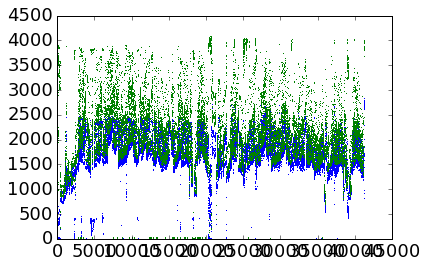

In [63]:
plot(spec_df.min0,',')
plot(spec_df.avg0,',')


In [116]:
plot(mdf.distance_to_sun,'.')

AttributeError: 'DataFrame' object has no attribute 'distance_to_sun'

(0.5, 2)

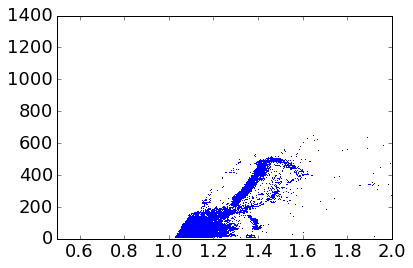

In [74]:
plot(spec_df.avg0/spec_df.min0,spec_df.rms0,',')
xlim(.5,2)

In [83]:
del spec_df['index']

In [85]:
del mdf['index']

In [86]:
mdf = pd.merge(spec_df,xsc_df,on=['which','filename'])

In [126]:
def plot_fits(row,index,do_emcee=False):
    if False:
        fig,axs = plt.subplots(1,6,figsize=(18,6))
        for k in range(6):
            ax = axs.flatten()[k]
            x = row.ky[2:-2]
            ax.loglog(x,row.ypsds[2:-2,k])
            pl = cloud_spec_fit.power_law(x,row.y_segment_powlaw_red_scale[k],row.y_segment_powlaw_red_exp[k]) + row.y_segment_powlaw_white_noise[k]
            ax.loglog(x,pl,lw=2)
            rolloff = cloud_spec_fit.full_model(x,red_scale = row.y_segment_roll_red_scale[k],
                                               red_exp = row.y_segment_roll_red_exp[k],
                                               roll_fc = row.y_segment_roll_roll_fc[k],
                                               roll_exp = row.y_segment_roll_roll_exp[k],
                                               white_noise=row.y_segment_roll_white_noise[k])
            ax.loglog(x,rolloff,'--',lw=2)
    fig,axs = plt.subplots(2,1,figsize=(12,12))
    ax = axs[1]
    x = row.ky[2:-2]
    ax.loglog(x,row.ypsds[2:-2,:].mean(1),'k',lw=2)
    ax.loglog(row.kx[2:-2],row.xpsds[2:-2,:].mean(1),'r',lw=2)
    pl = cloud_spec_fit.power_law(x,row.y_whole_image_powlaw_red_scale,row.y_whole_image_powlaw_red_exp) + row.y_whole_image_powlaw_white_noise
    ax.loglog(x,pl,':',lw=2)
    rolloff = cloud_spec_fit.full_model(x,red_scale = row.y_whole_image_roll_red_scale,
                                       red_exp = row.y_whole_image_roll_red_exp,
                                       roll_fc = row.y_whole_image_roll_roll_fc,
                                       roll_exp = row.y_whole_image_roll_roll_exp,
                                       white_noise=row.y_whole_image_roll_white_noise)
    ax.loglog(x,rolloff,color='r',lw=1.2)
    ax.loglog(x,row.ypsds[2:-2,:].mean(1)-row.y_whole_image_roll_white_noise)
    rolloff_nn = cloud_spec_fit.full_model(x,red_scale = row.y_whole_image_roll_red_scale,
                                       red_exp = row.y_whole_image_roll_red_exp,
                                       roll_fc = row.y_whole_image_roll_roll_fc,
                                       roll_exp = row.y_whole_image_roll_roll_exp,
                                       white_noise=0)
    ax.loglog(x,rolloff_nn,'--',lw=2)
    
    ax.loglog(x,row.y_whole_image_roll_red_scale*x**(row.y_whole_image_roll_red_exp),':',lw=2)
    ax.text(1e2,row.y_whole_image_roll_red_scale*(1e2)**(row.y_whole_image_roll_red_exp),
           ('$k^{%.2f}$' % row.y_whole_image_roll_red_exp), size='x-large')
    ax.loglog(x,x**(-row.y_whole_image_roll_roll_exp+row.y_whole_image_roll_red_exp),':',lw=2)
    ax.text(2,(2.)**(-row.y_whole_image_roll_roll_exp+row.y_whole_image_roll_red_exp),
           ('$k^{%.2f}$' % (row.y_whole_image_roll_red_exp-row.y_whole_image_roll_roll_exp)), size='x-large')
    
    
    if do_emcee:
        lmres,sampler,labels = cloud_spec_fit.emcee_fit_full(x,row.ypsds[2:-2,:].mean(1))
        for theta in sampler.flatchain[-100:]:
            ax.loglog(x,cloud_spec_fit.full_model_log(x,*theta)-10.**theta[-1],alpha=0.05,color='k')
        blah = corner.corner(sampler.flatchain,labels=labels)
    
    ax.axvline(row.y_whole_image_roll_roll_fc,linestyle='--')
    ax.text(row.y_whole_image_roll_roll_fc,2e-4,('$k_c=%.1f$/km' % row.y_whole_image_roll_roll_fc),size='x-large')
    ax.set_ylim(1e-4,1e2)
    ax.set_xlim(.3,300)
    ax.set_xlabel('wavenumber (cycles/km)')
    ax = axs[0]
    d = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_flat_field_correction=True,apply_gradient_removal=True)
    d = leveling.level(d)
    ax.imshow(d,cmap=cm.gray,aspect='auto',origin='lower')
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    fig.suptitle('%d: %s' % (index,row.filename))

In [87]:
mdf = mdf.reset_index()

In [92]:
dd.index.max()

41261

In [94]:
subsel = mdf[(mdf.lat !=0) & (mdf.el_guess >0.5) &(mdf.alt>30000) 
             & (mdf.alt < 40000) & (mdf.dec_err < 0.02) & (mdf.el_guess < (55*np.pi/180.))
            & ~(mdf.rms0.isnull())]

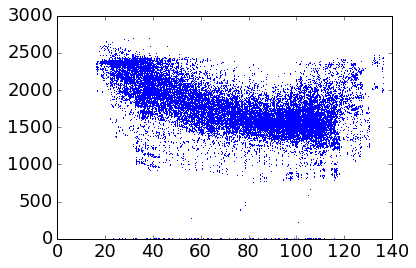

In [122]:
plot(subsel.distance_from_sun*180/np.pi,subsel.min0,',')

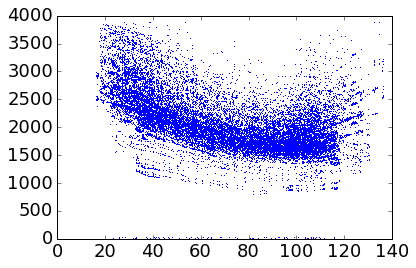

In [123]:
plot(subsel.distance_from_sun*180/np.pi,subsel.avg0,',')

In [155]:
subsel.shape

(32586, 95)

In [160]:
32*300*32*400/1e6

122.88

In [161]:
256*3/2.

384.0

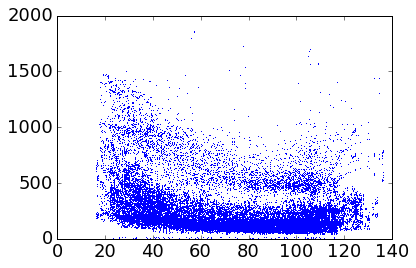

In [124]:
plot(subsel.distance_from_sun*180/np.pi,subsel.avg0-subsel.min0,',')

In [162]:
leveling.level??

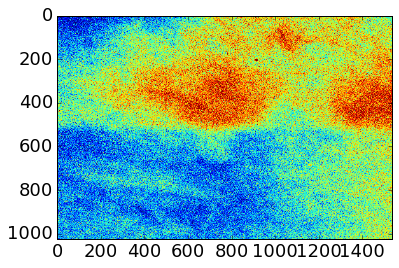

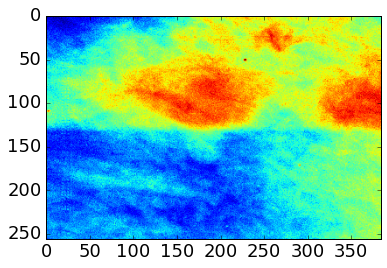

In [167]:
imshow(d,aspect='auto')
figure()
imshow(d.reshape((1024//4,4,384,4)).mean(1).mean(2),aspect='auto')

In [178]:
import scipy.stats

In [ ]:
scipy.stats.scoreatpercentile()

In [190]:
from matplotlib.backends.backend_agg import FigureCanvasAgg
from matplotlib.figure import Figure

In [191]:
import sys

In [260]:
row = dd.iloc[1025]
d = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_flat_field_correction=True,apply_gradient_removal=False)
d = loading.remove_gradient(d,vertical=True,horizontal=True)

In [252]:
row = dd.iloc[1025]
d = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_flat_field_correction=False,apply_gradient_removal=False)


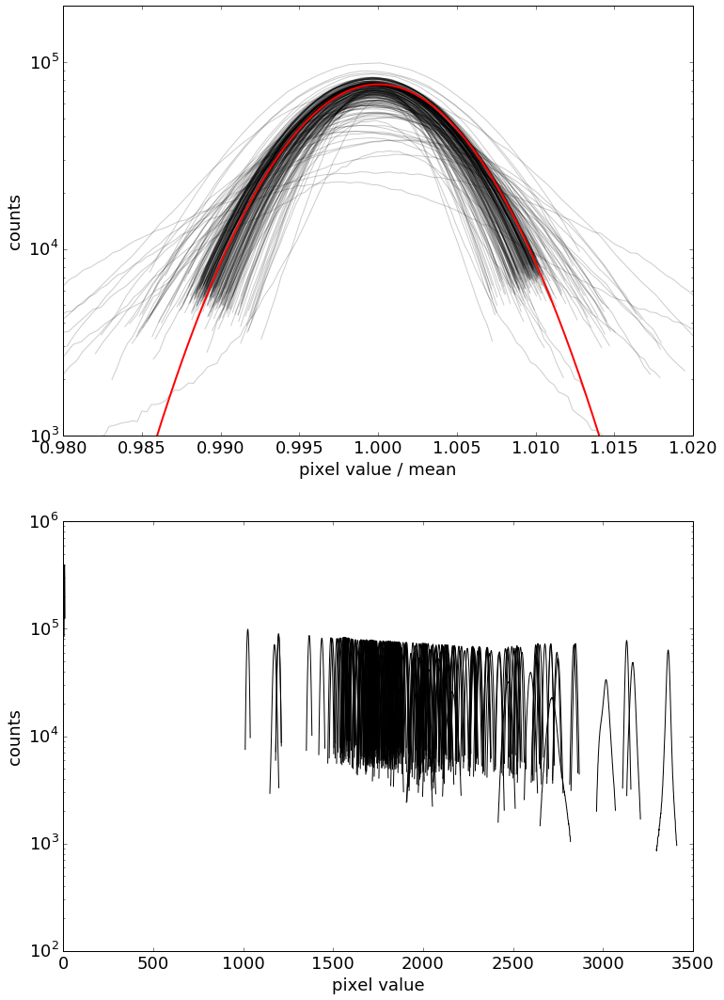

In [275]:
fig,axs = subplots(2,1,figsize=(12,18))
for k in range(256):
    row = dd.iloc[k*18]
    d = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_flat_field_correction=True,apply_gradient_removal=False)
    d = loading.remove_gradient(d,vertical=True,horizontal=True)
    per1,per99 = np.percentile(d.flatten(),[1.,99.])
    h,b = np.histogram(d.flatten(),bins=np.arange(np.round(per1),np.round(per99)))
    axs[0].semilogy(b[:-1]/d.mean(),h,color='k',alpha=0.2)
    axs[1].semilogy(b[:-1],h,color='k')
x = np.linspace(1700,1900,1000)
mu = 1800.*1e5/4096.
sigma = np.sqrt(mu)
y = scipy.stats.distributions.norm.pdf(x*1e5/4096.,mu,sigma)
axs[0].semilogy(x/1800.,y*4e7,'r',lw=2)
axs[0].set_xlim(0.98,1.02)
axs[0].set_ylim(1e3,2e5)
axs[0].set_ylabel('counts')
axs[0].set_xlabel('pixel value / mean')
axs[1].set_xlabel('pixel value')
axs[1].set_ylabel('counts')

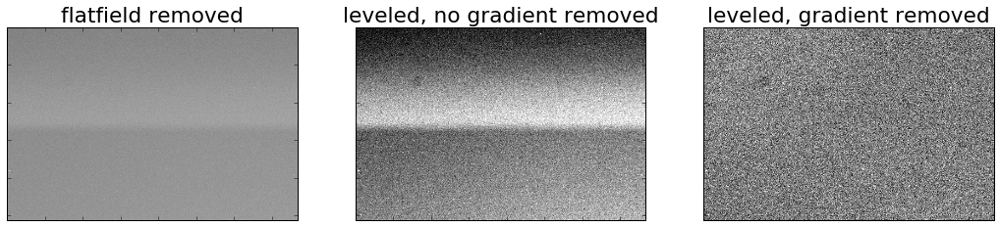

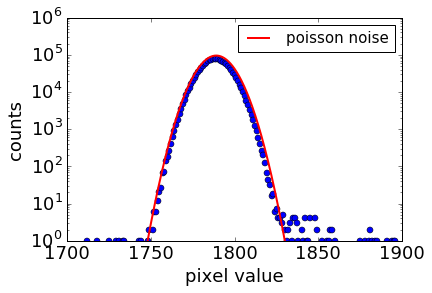

In [282]:
row = dd.iloc[1025]
d = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_flat_field_correction=True,apply_gradient_removal=False)
fig,axs = subplots(1,3,figsize=(18,6))
axs[0].imshow(d,cmap=cm.gray)
axs[1].imshow(leveling.level(d),cmap=cm.gray)

d = loading.remove_gradient(d,vertical=True,horizontal=True)
axs[2].imshow(leveling.level(d),cmap=cm.gray)
axs[0].set_title('flatfield removed')
axs[1].set_title('leveled, no gradient removed')
axs[2].set_title('leveled, gradient removed')
for ax in axs:
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
figure()
h,b = np.histogram(d.flatten(),bins=np.arange(1700,1900))
semilogy(b[:-1],h,'o')
mu = d.mean()*1e6/4096./10.
sigma = np.sqrt(mu)
x = np.linspace(1700,1900,1000)
y = scipy.stats.distributions.norm.pdf(x*1e6/4096./10.,mu,sigma)
semilogy(x,y*5e7,lw=2,color='r',label='poisson noise')
legend(loc='upper right',prop=dict(size='small'))
ylim(1,1e6)
xlabel('pixel value')
ylabel('counts')

In [323]:
1024-6*32-5

827

2042.44531735
1887.38595095
2511.59970249
2204.43846235


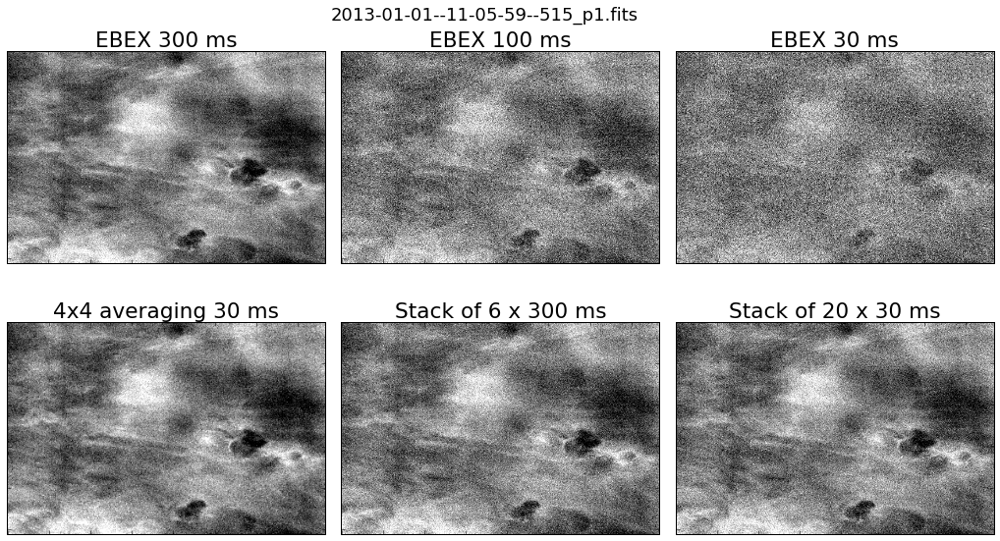

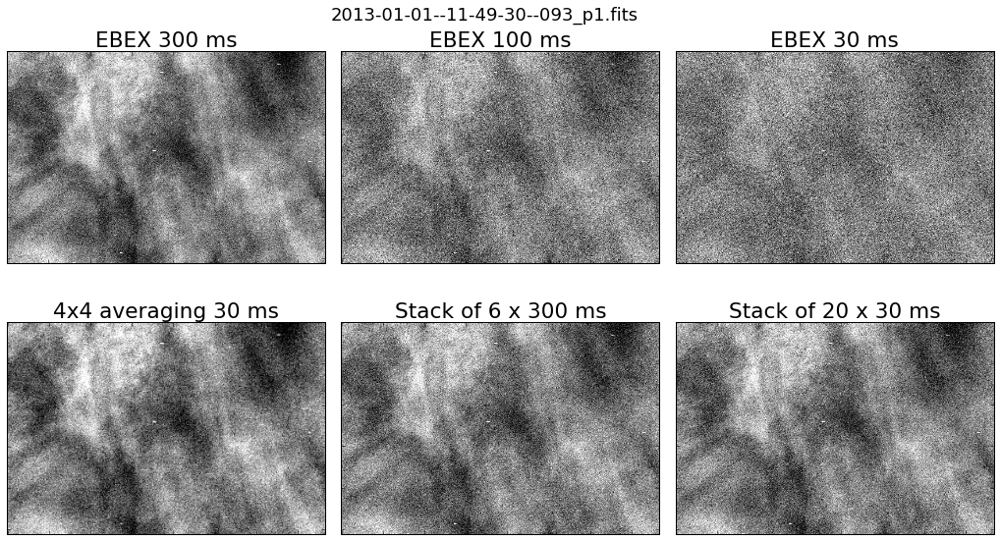

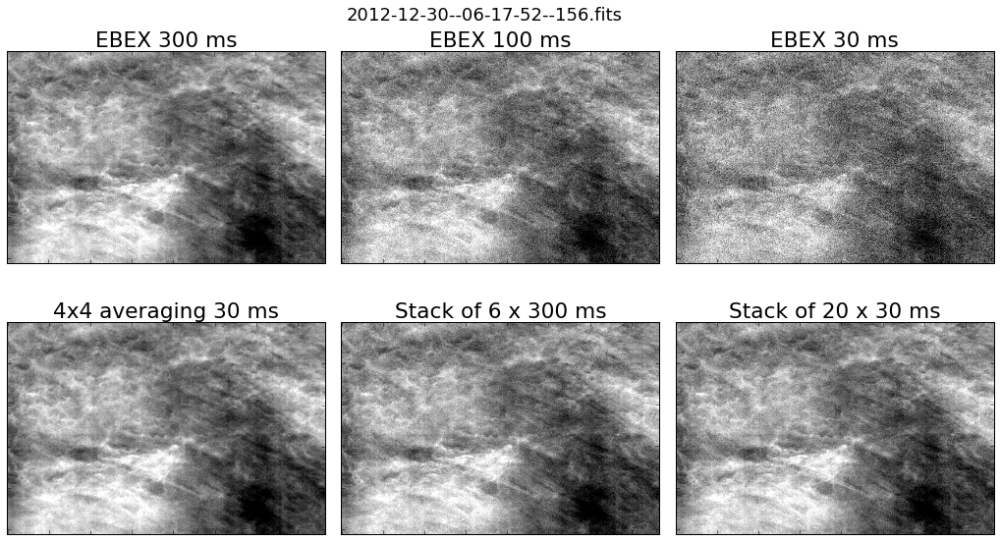

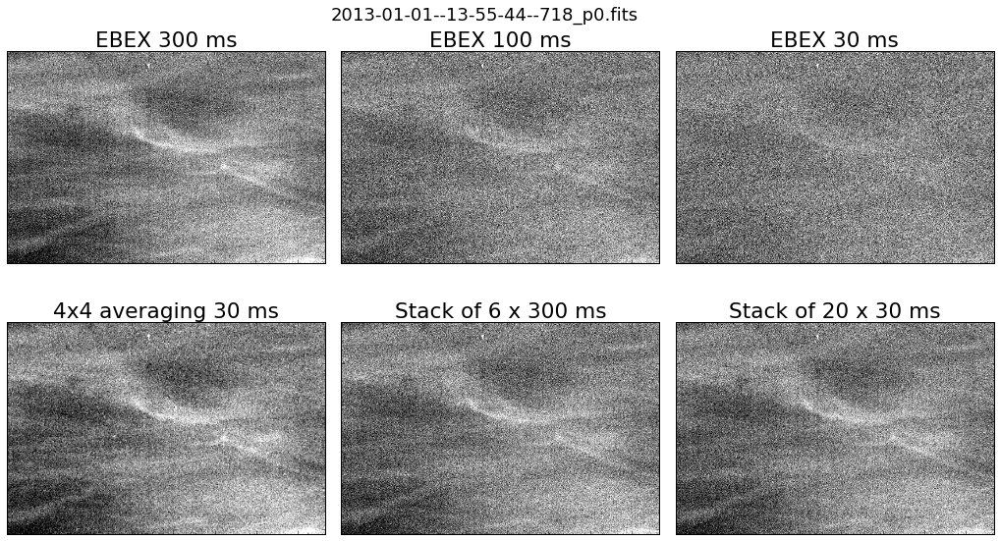

In [333]:
for idx in [595,650,8,800]:
    row = dd.iloc[idx]
    d = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_flat_field_correction=True,apply_gradient_removal=False)
    print d.mean()
    fig,axs = subplots(2,3,figsize=(18,12))
    fig.subplots_adjust(wspace=.05,hspace=-0.3)
    d = loading.remove_gradient(d,vertical=True,horizontal=True)
    axs[0,0].imshow(leveling.level(d),cmap=cm.gray)
    axs[0,0].set_title('EBEX 300 ms')
    d = d*1e5/4096
    d2 = d/3.0 + np.random.randn(*d.shape)*np.sqrt(d.mean()/3.0)
    axs[0,1].imshow(leveling.level(d2),cmap=cm.gray)
    axs[0,1].set_title('EBEX 100 ms')
    d2 = d/10.0 + np.random.randn(*d.shape)*np.sqrt(d.mean()/10.0)
    axs[0,2].imshow(leveling.level(d2),cmap=cm.gray)
    axs[0,2].set_title('EBEX 30 ms')

    stack = np.array([d/10.0 + np.random.randn(*d.shape)*np.sqrt(d.mean()/10.0) for k in range(20)]).mean(0)
    axs[1,2].imshow(leveling.level(stack),cmap=cm.gray)
    axs[1,2].set_title('Stack of 20 x 30 ms')
    
    subpix = d2.reshape((256,4,384,4)).mean(1).mean(2)
    axs[1,0].imshow(leveling.level(subpix),cmap=cm.gray)
    axs[1,0].set_title('4x4 averaging 30 ms')
    

    stack = np.array([d/3.0 + np.random.randn(*d.shape)*np.sqrt(d.mean()/3.0) for k in range(6)]).mean(0)
    axs[1,1].imshow(leveling.level(stack),cmap=cm.gray)
    axs[1,1].set_title('Stack of 6 x 300 ms')

    #axs[1,0].set_title('EBEX 300 ms')
    #axs[1,0].imshow(leveling.level(d),cmap=cm.gray)

    fig.text(0.5,.85,row.filename,va='top',ha='center')

    for ax in axs.flatten():
        ax.xaxis.set_ticklabels([])
        ax.yaxis.set_ticklabels([])


In [309]:
images = np.array([d/10.0 + np.random.randn(*d.shape)*np.sqrt(d.mean()/10.0) for k in range(20)])

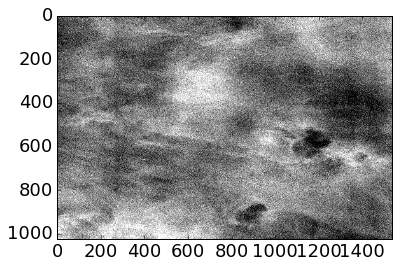

In [310]:
imshow(leveling.level(images.mean(0)),cmap=cm.gray)

(1, 1000000.0)

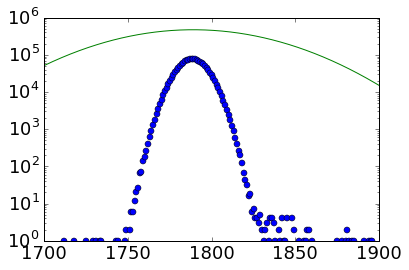

In [266]:
h,b = np.histogram(d.flatten(),bins=np.arange(1700,1900))
semilogy(b[:-1],h,'o')
mu = d.mean()
sigma = np.sqrt(mu)
x = np.linspace(1700,1900,1000)
y = scipy.stats.distributions.norm.pdf(x,mu,sigma)
semilogy(x,y*5e7)
ylim(1,1e6)

In [254]:
h

array([  114,    97,   109,   106,   144,   138,   170,   175,   200,
         198,   199,   213,   218,   275,   250,   250,   271,   243,
         250,   272,   236,   278,   251,   259,   240,   255,   271,
         275,   239,   252,   270,   286,   313,   341,   364,   359,
         400,   406,   414,   475,   530,   597,   742,   795,   857,
        1003,  1149,  1325,  1544,  1837,  2058,  2484,  2903,  3403,
        3838,  4488,  5079,  5757,  6574,  7433,  8518,  9573, 10780,
       11680, 13294, 14715, 16003, 17621, 19055, 20745, 22200, 23220,
       24912, 26286, 27805, 28808, 29725, 31118, 31604, 32541, 32864,
       33303, 33588, 33993, 33985, 33503, 33277, 32649, 32663, 31880,
       31251, 31013, 30046, 29596, 29090, 27722, 27403, 26953, 26382,
       25647, 25002, 24729, 24140, 23542, 22599, 22188, 21928, 21172,
       20618, 19928, 19433, 18440, 17801, 17064, 16339, 15176, 14314,
       13464, 12407, 11341, 10314,  9557,  8625,  7750,  6756,  5947,
        5305,  4417,

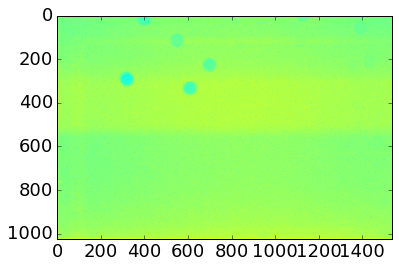

In [242]:
imshow(d)

In [231]:
mu

436748.4253235436

In [243]:
1700*1e6/4096.

415039.0625

In [244]:
1.8**2/3**2.

0.36000000000000004

In [255]:
300*_244*.3

32.400000000000006

In [256]:
700*_244*.3

75.60000000000001

In [259]:
7.5e4*4096/1e6*16

4915.2

In [232]:
1e6*10e-6

10.0

In [230]:
100*1e6/4096.

24414.0625

In [233]:
1800*10./4096.

4.39453125

In [234]:
4.39/10e-6

438999.99999999994

In [235]:
row

index                                                                                3581
avg                                     [1789.98999234, 1780.36181805, 1784.22490199, ...
avg0                                                                              1788.93
filename                                                2013-01-01--16-34-04--890_p1.fits
kx                                      [0.0, 0.388887314357, 0.777774628715, 1.166661...
ky                                      [0.0, 0.305902229081, 0.611804458162, 0.917706...
min                                     [1742.37644485, 1739.84031379, 1736.81287466, ...
min0                                                                              1530.15
rms                                     [14.5736044018, 13.3673154999, 13.8082609696, ...
rms0                                                                               14.422
which                                                                                   0
x_whole_im

In [239]:
!head /data/ebex/ld2012/flight/raw/acs_v0-0/xsc0/files/data/images/2013-01-01/2013-01-01--16-34-04--890_p0.fits

SIMPLE  =                    T / file does conform to FITS standard             BITPIX  =                   16 / number of bits per data pixel                  NAXIS   =                    2 / number of data axes                            NAXIS1  =                 1536 / length of data axis 1                          NAXIS2  =                 1024 / length of data axis 2                          EXTEND  =                    T / FITS dataset may contain extensions            COMMENT   FITS (Flexible Image Transport System) format is defined in 'AstronomyCOMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H WHICH   = 'x0      '                                                            HIERARCH COUNTER_STARS =   436                                                  HIERARCH COUNTER_FCP =    1057                                                  HIERARCH APPROX_LAT = -77.3996763333333 / DEGREES                               HIERARCH APPROX_LST =   17.655 / HOURS  

In [237]:
rawpath

'/data/ebex/ld2012/flight/raw/acs_v0-0/'

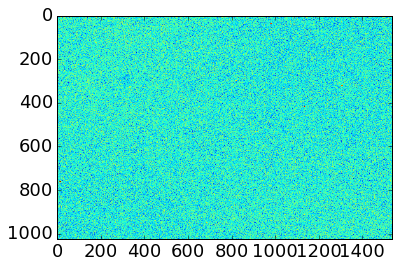

In [225]:
imshow(d)
clim(1750,1850)

In [334]:
dd = subsel[subsel.distance_from_sun > 60*np.pi/180.]
def plot_tile(dd,base):
    data = np.empty((32*256,32*384),dtype='uint8')
    done = False
    for k in range(32):
        if done:
            break
        for m in range(32):
            idx = k*32+m + base
            if idx >= dd.shape[0]:
                done = True
                break
            else:
                row = dd.iloc[idx]
                d = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_flat_field_correction=True,apply_gradient_removal=False)
                d = loading.remove_gradient(d,vertical=True,horizontal=True)
                d = d.reshape((256,4,384,4)).mean(1).mean(2)
#                min1 = scipy.stats.scoreatpercentile(d.flat,per=1.0)
#                d = (d.astype('float')-min1)*255/50.
#                d = d.clip(0,255).astype('uint8')
                d = leveling.level(d,mode=255)
                data[k*256:(k+1)*256,m*384:(m+1)*384] = d
    fig = Figure(figsize=(24,18))
    ax = fig.add_axes([0,0,1,1])
    ax.imshow(data,cmap=cm.gray,aspect='auto')
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    canvas = FigureCanvasAgg(fig)
    canvas.print_figure("/home/gjones/cloud_plots/autoscale_tiles/%05d.jpg" % base, bbox_inches='tight')



In [335]:
pp = joblib.Parallel(n_jobs=20)

In [336]:
pp(joblib.delayed(plot_tile)(dd,base) for base in range(0,dd.shape[0],1024))

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [187]:
data.shape

(8192, 12288)

[]

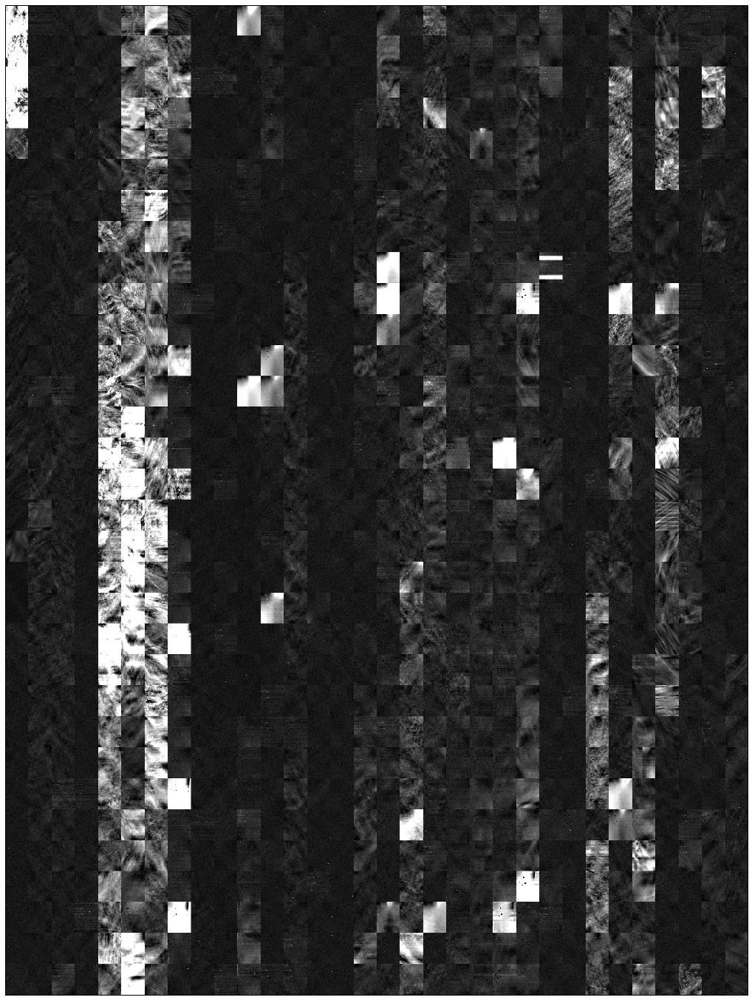

In [189]:
figure(figsize=(18,24))
imshow(data.T,cmap=cm.gray,aspect='auto')
ax = gca()
ax.xaxis.set_ticklabels([])
ax.yaxis.set_ticklabels([])

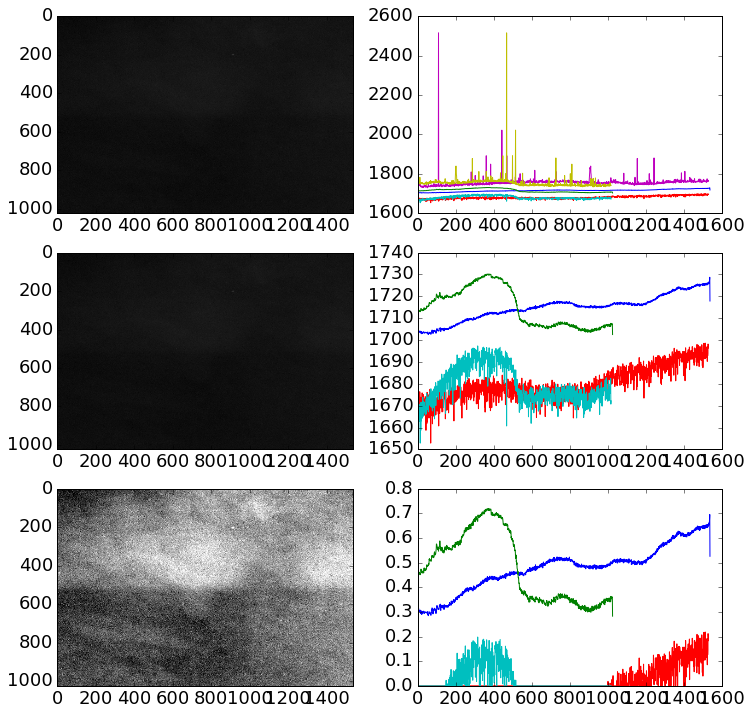

In [154]:
row = mdf.ix[19664]
d = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_flat_field_correction=True,apply_gradient_removal=False)
fig,axs = subplots(3,2,figsize=(12,12))
axs[0,0].imshow(d,cmap=cm.gray)
pr = d.mean(0)
axs[0,1].plot(pr)
axs[0,1].plot(d.mean(1))
axs[0,1].plot(d[4:-4,4:-4].min(0))
axs[0,1].plot(d[4:-4,4:-4].min(1))
axs[0,1].plot(d[4:-4,4:-4].max(0))
axs[0,1].plot(d[4:-4,4:-4].max(1))
d1 = loading.get_image_array_from_filename(rawpath,row.which,row.filename,apply_flat_field_correction=True,apply_gradient_removal=True)
axs[1,0].imshow(d,cmap=cm.gray)
pr = d.mean(0)
axs[1,1].plot(pr)
axs[1,1].plot(d.mean(1))
axs[1,1].plot(d[4:-4,4:-4].min(0))
axs[1,1].plot(d[4:-4,4:-4].min(1))
d = leveling.level(d)
axs[2,0].imshow(d,cmap=cm.gray)
pr = d.mean(0)
axs[2,1].plot(pr)
axs[2,1].plot(d.mean(1))
axs[2,1].plot(d[4:-4,4:-4].min(0))
axs[2,1].plot(d[4:-4,4:-4].min(1))



In [149]:
ff = d1.flatten()

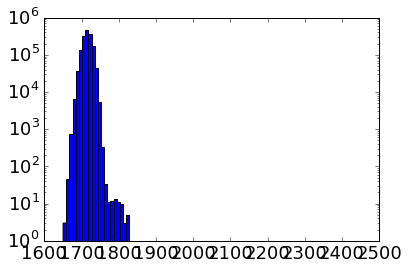

In [153]:
blah = hist(ff,log=True,bins=100)

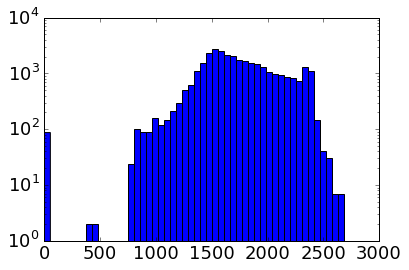

In [101]:
blah = hist(subsel.min0.values,bins=50,log=True)

17585
24005
2895
8796
39964
34031
7682
16174
32522
17969


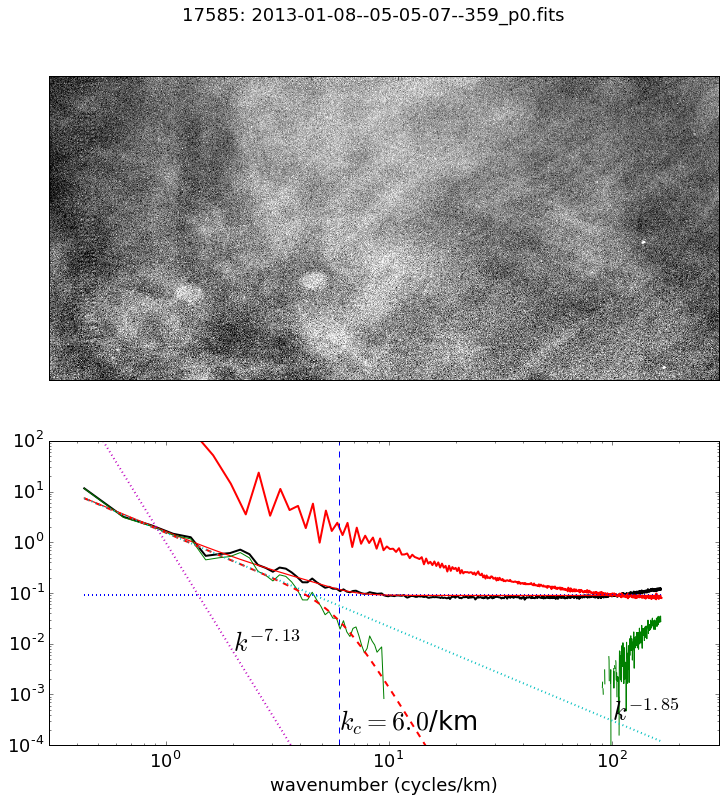

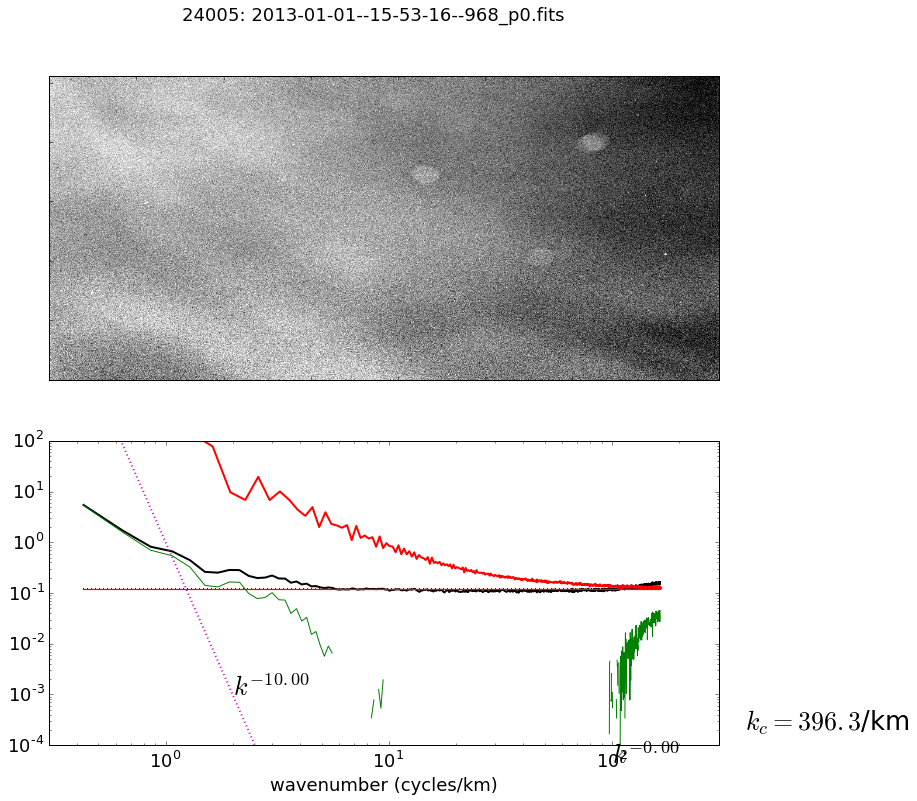

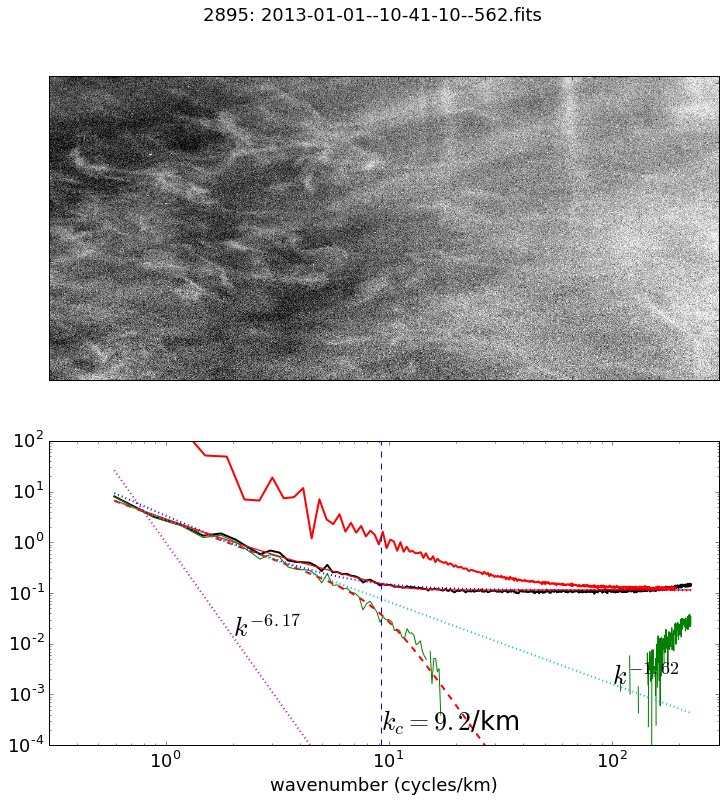

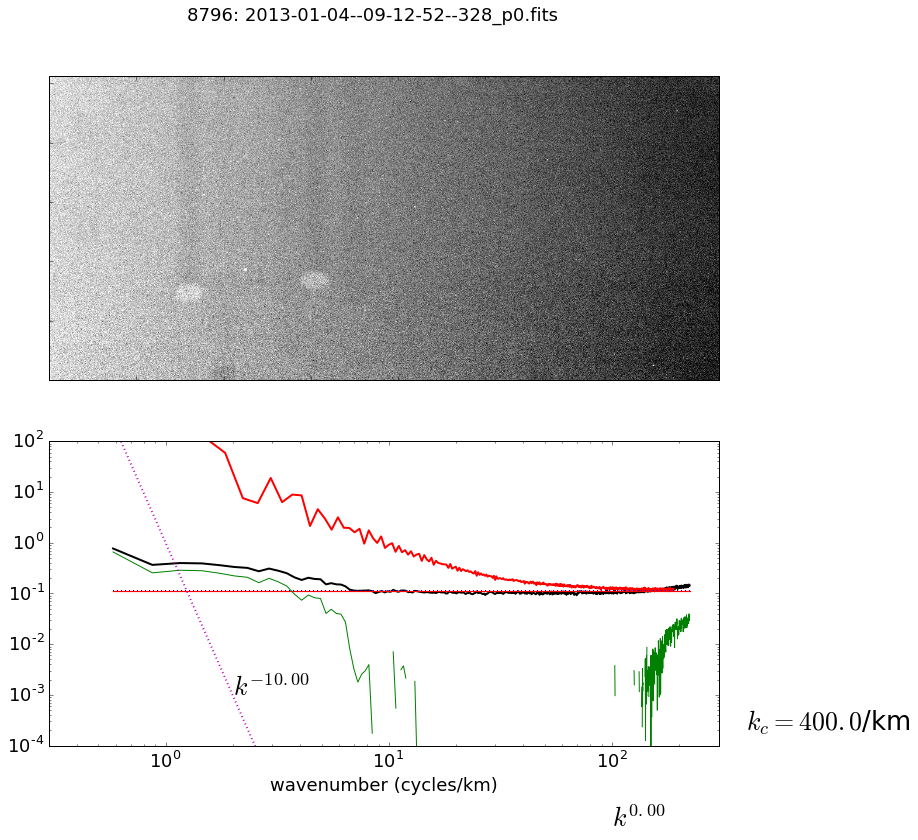

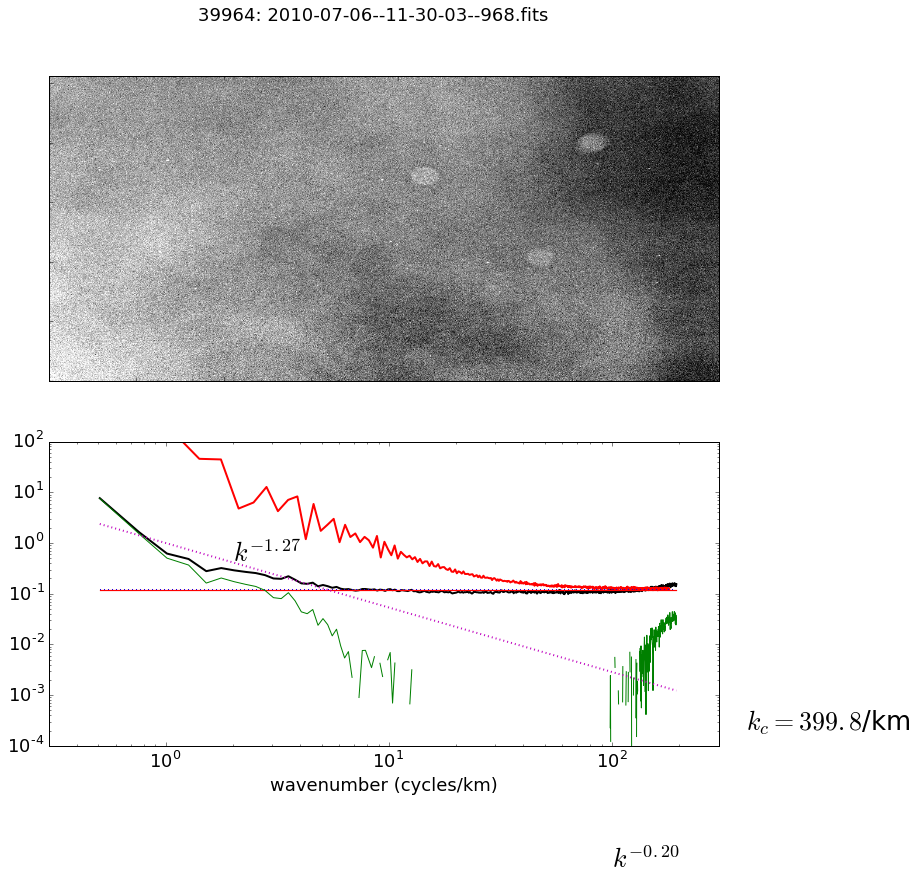

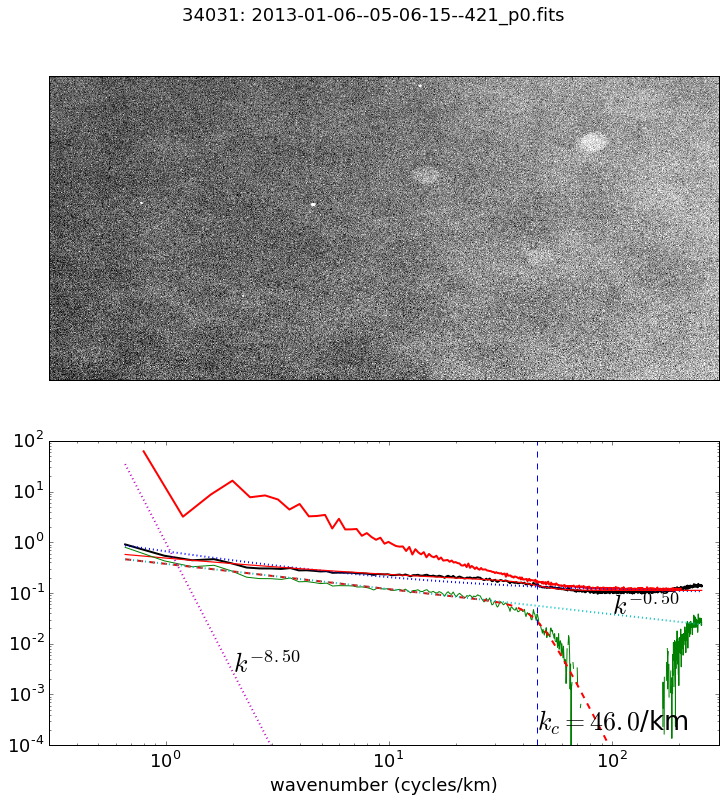

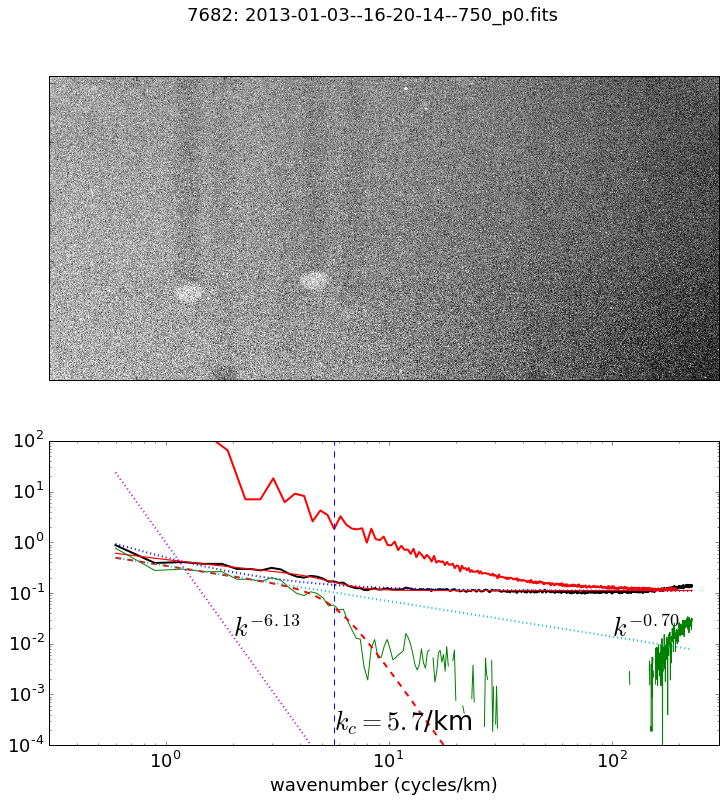

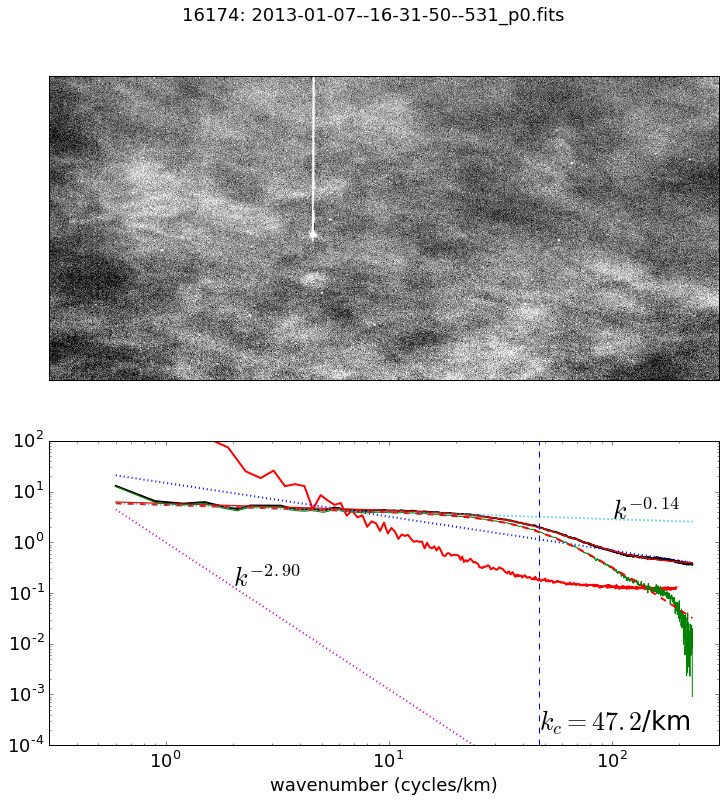

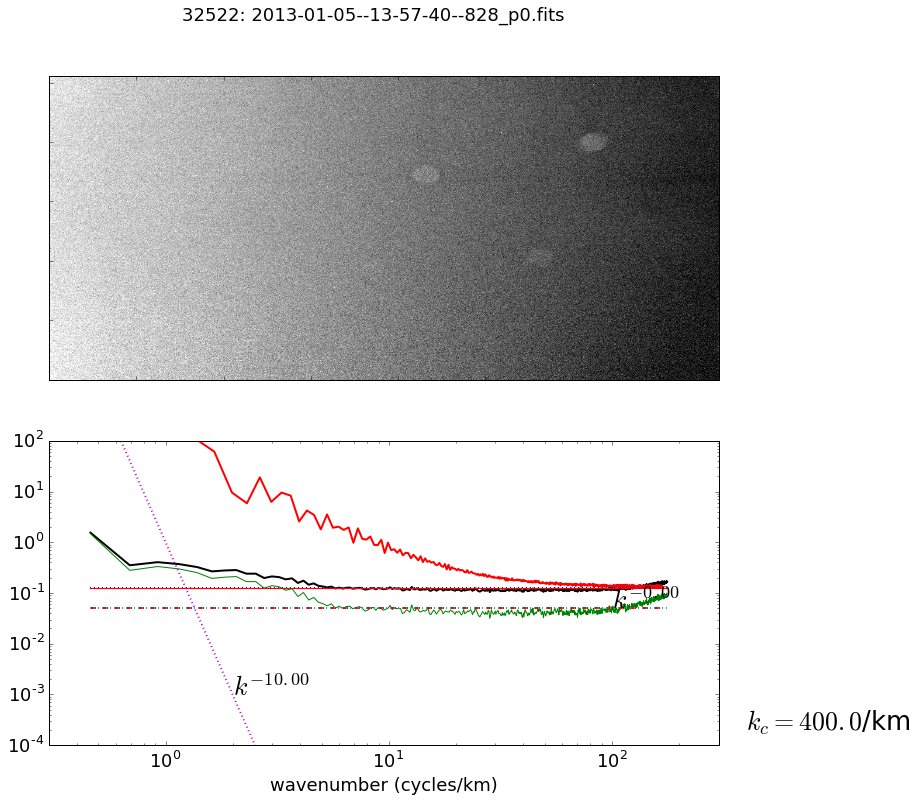

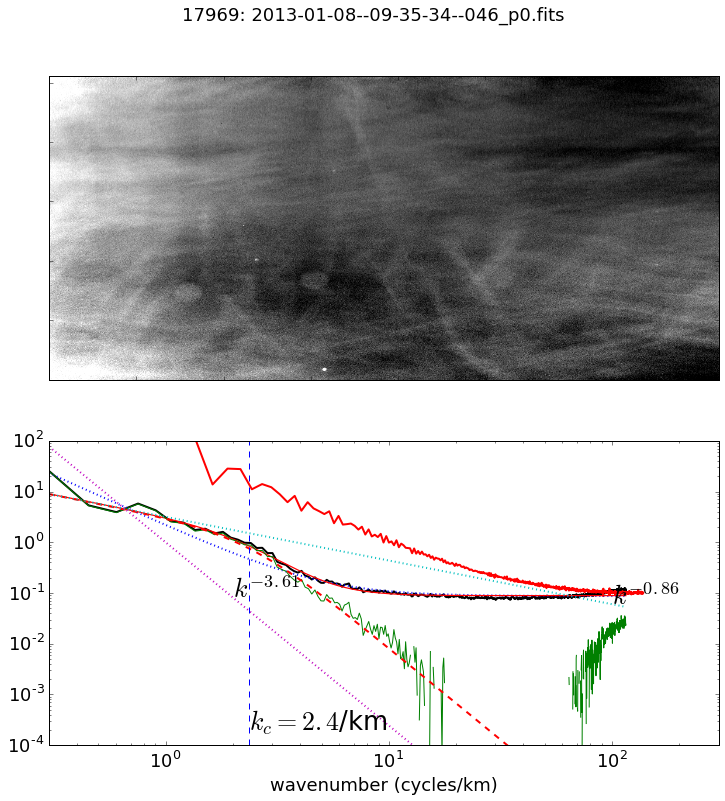

In [127]:
dd = subsel[(subsel.avg0-subsel.min0>500)  & (subsel.distance_from_sun > (60*np.pi/180.)) & (subsel.min0>500) ]
random.seed(123)
idxs = random.choice(dd.index,size=(10,),replace=False)
for k in idxs:
    print k
#    if random.random()<1.25:
    plot_fits(dd.ix[k],k)

38484
18357
17979
38878
11689
11850
38664
11593
38802
3483


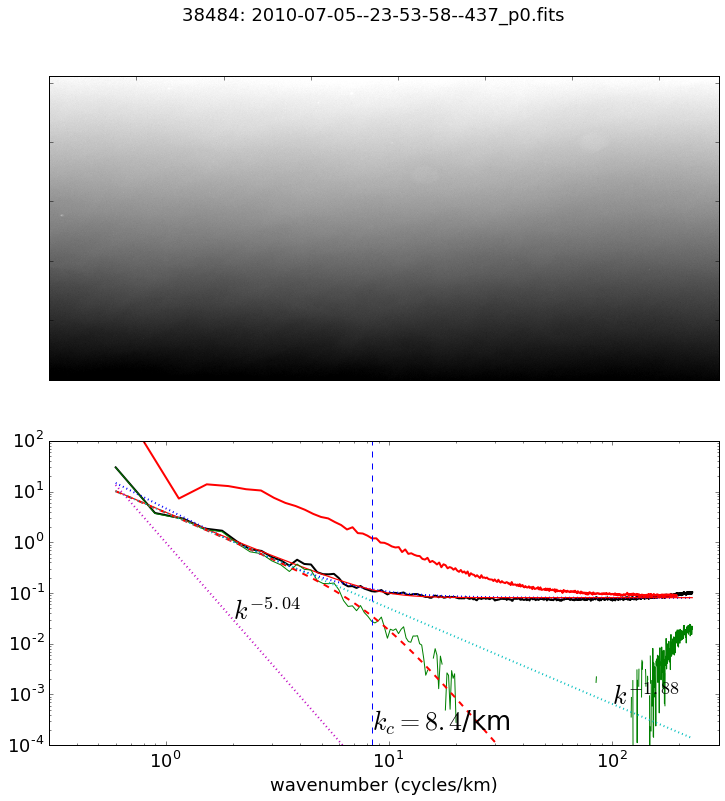

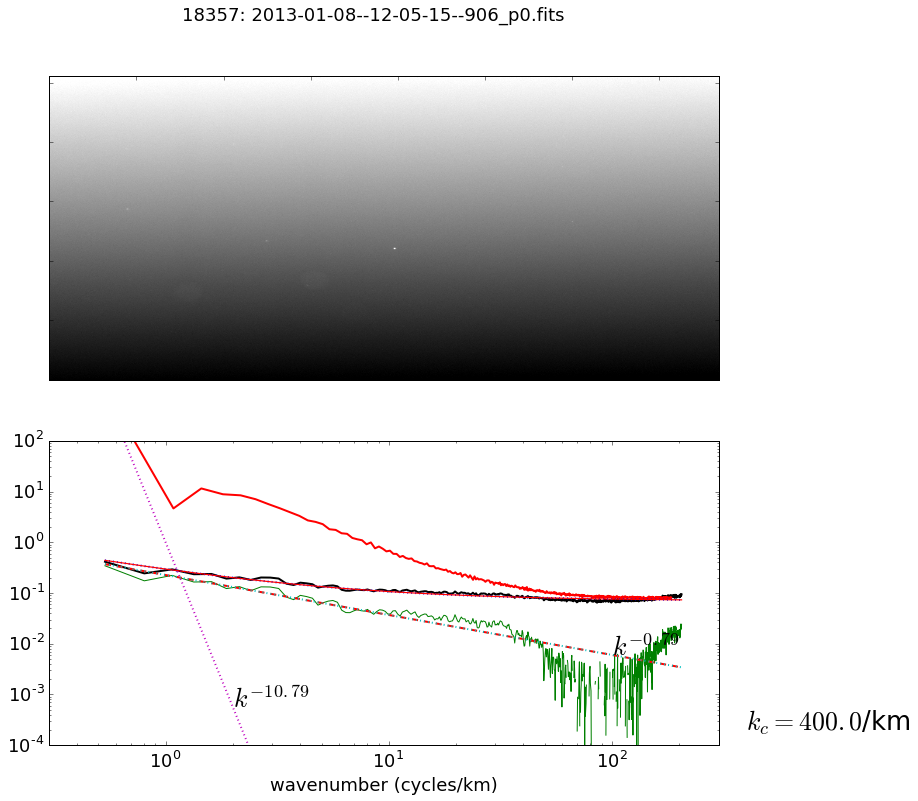

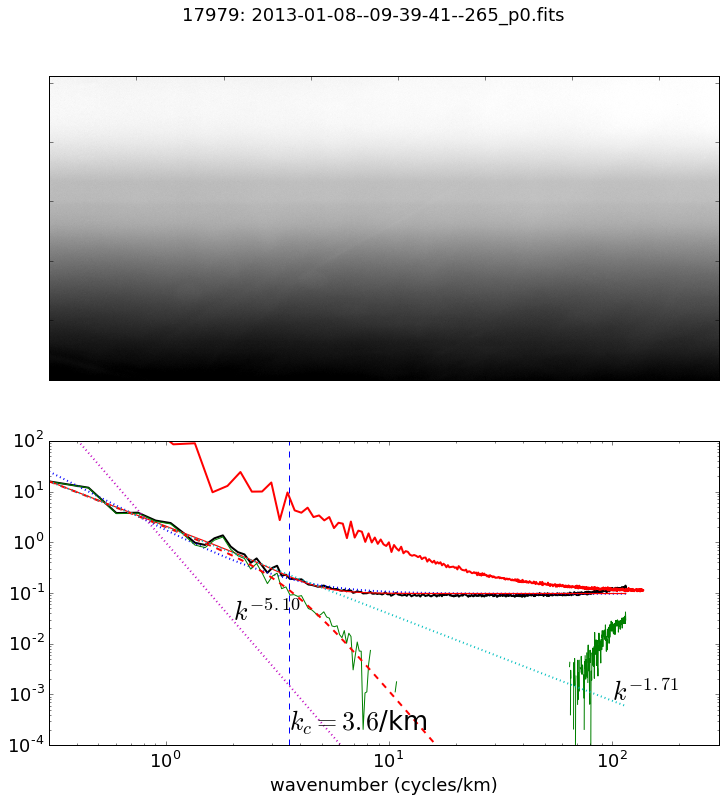

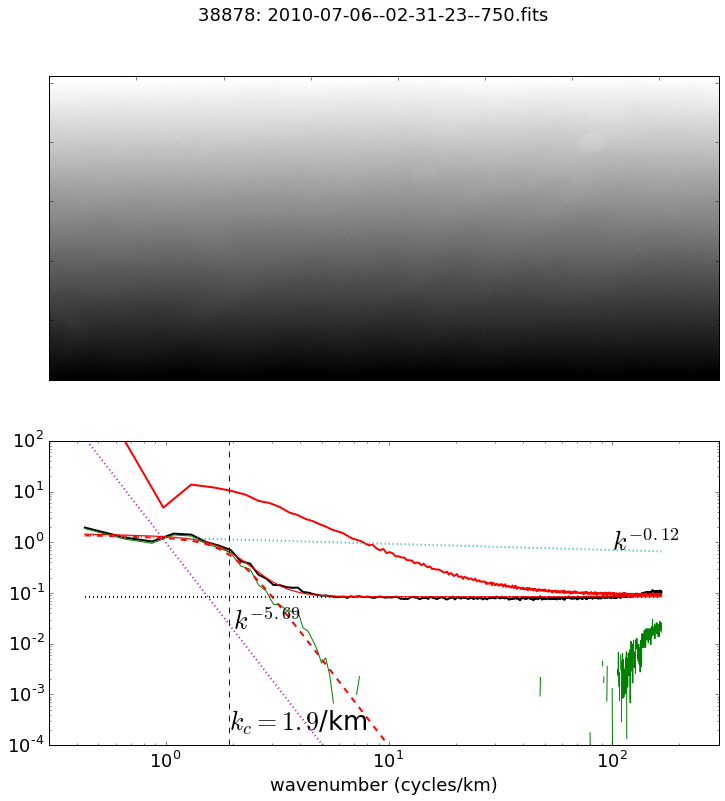

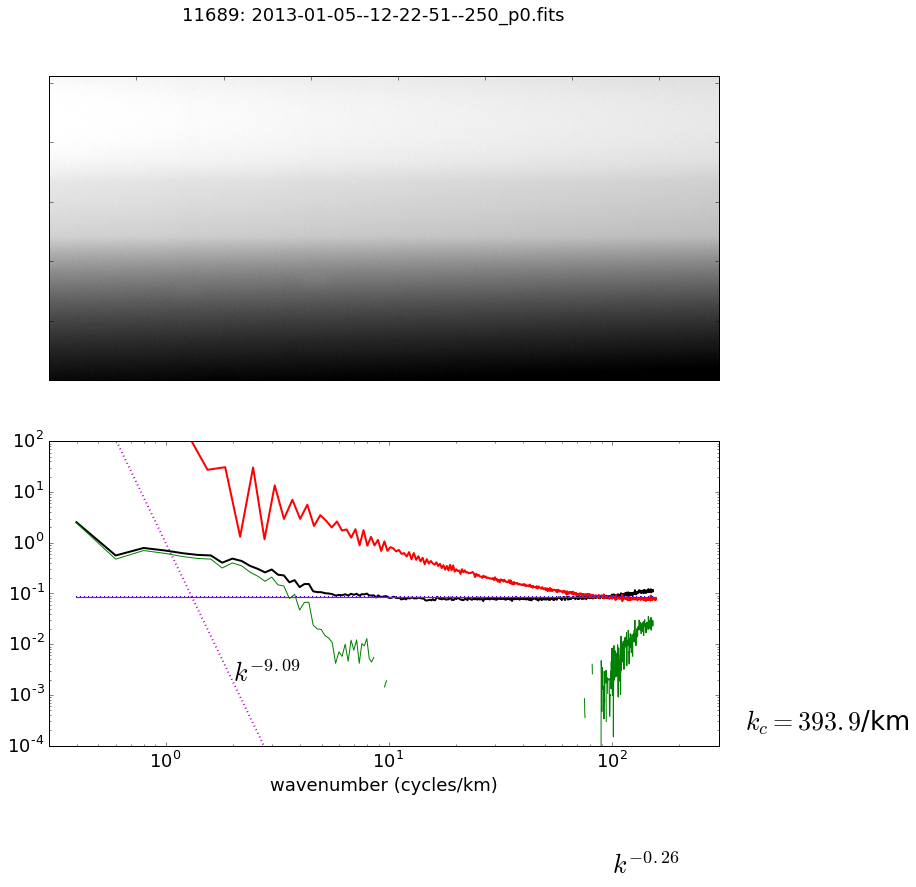

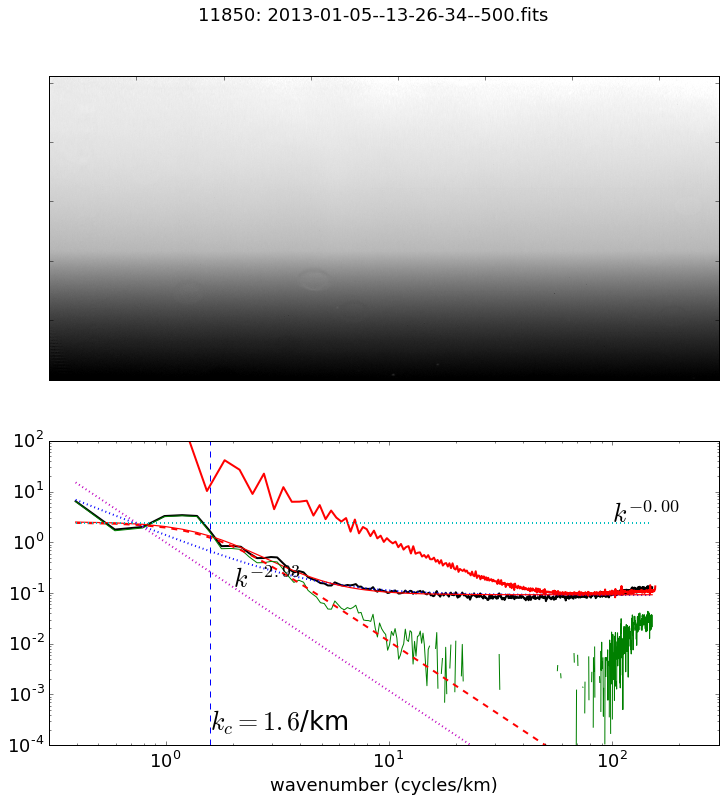

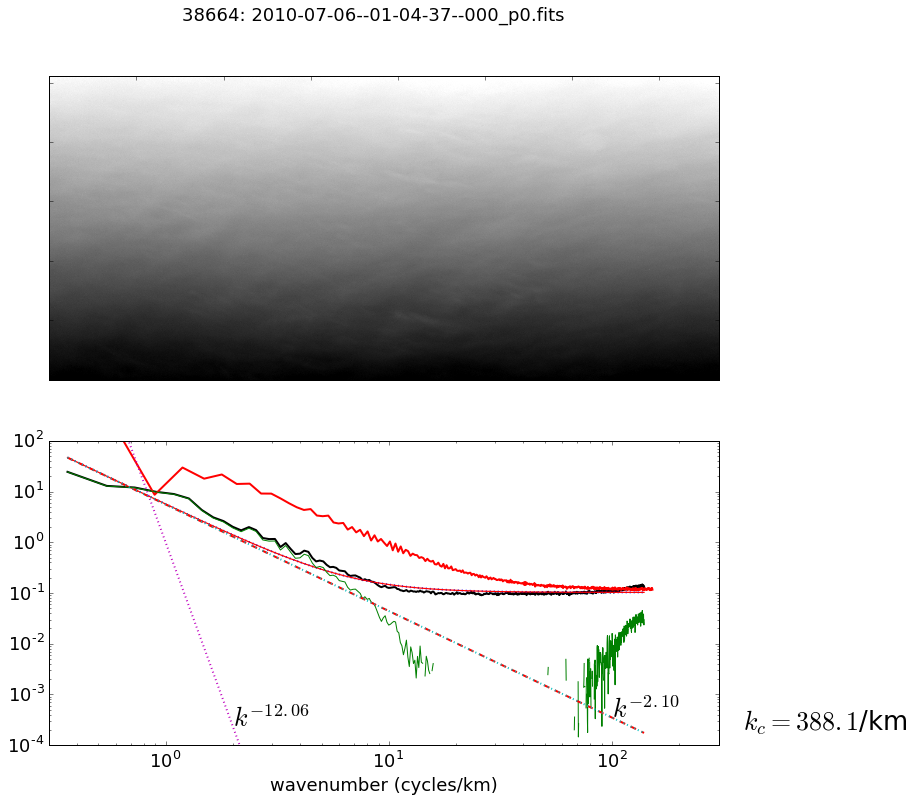

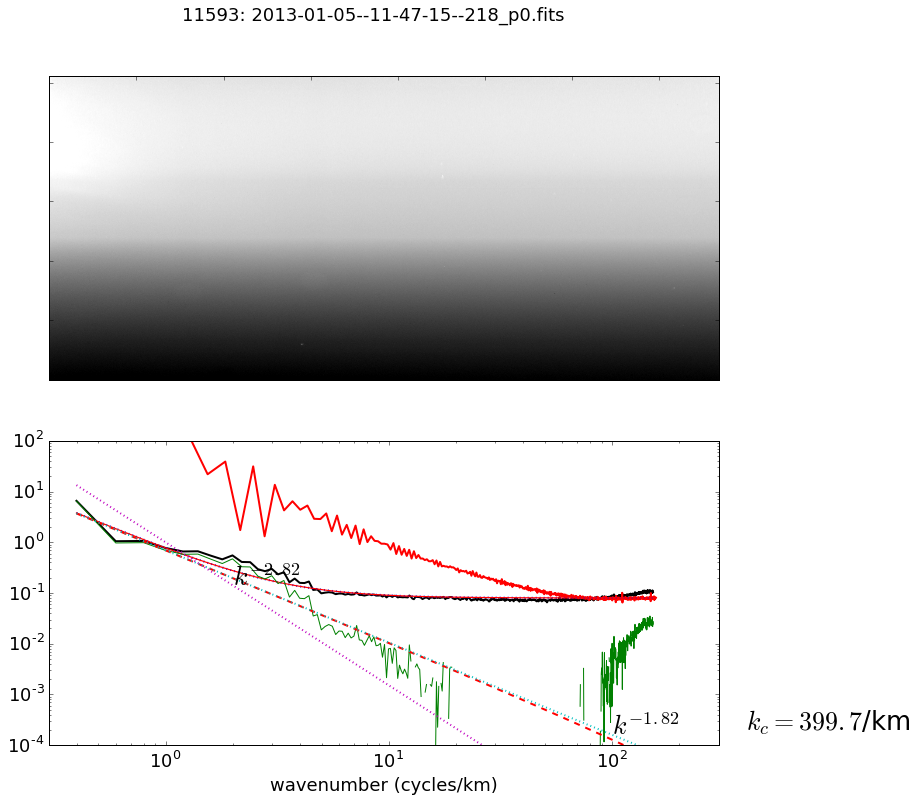

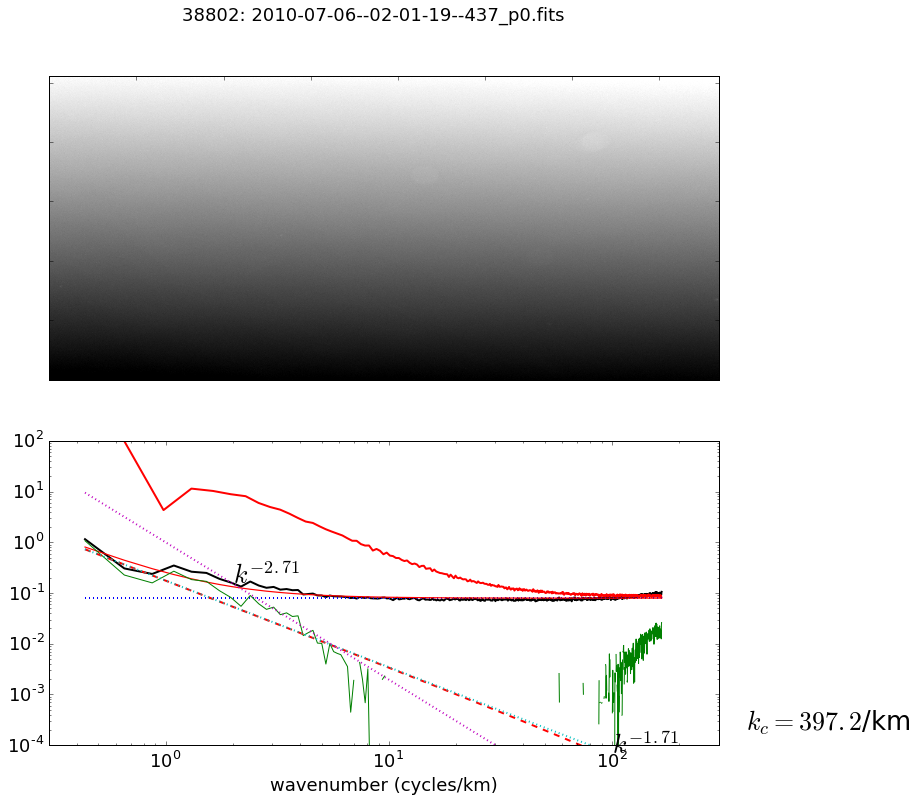

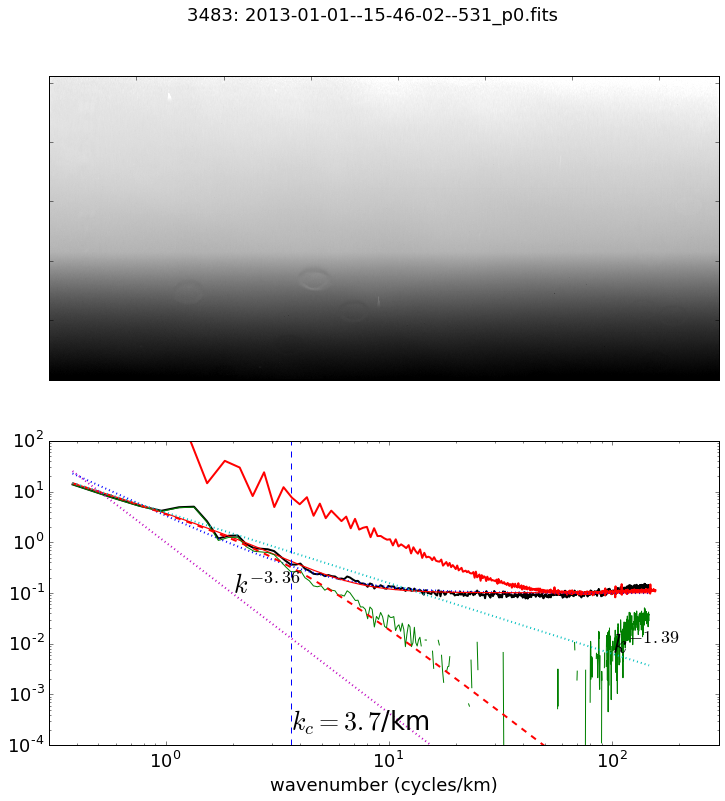

In [113]:
dd = subsel[(subsel.avg0/subsel.min0>1.4) & (subsel.rms0>200) & (subsel.distance_from_sun > (60*np.pi/180.)) & (subsel.min0>500) ]
random.seed(123)
idxs = random.choice(dd.index,size=(10,),replace=False)
for k in idxs:
    print k
#    if random.random()<1.25:
    plot_fits(dd.ix[k],k)

In [110]:
dd.shape

(231, 95)

(0.5, 2)

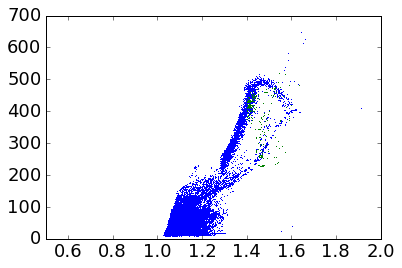

In [111]:
plot(subsel.avg0/subsel.min0,subsel.rms0,',')
plot(dd.avg0/dd.min0,dd.rms0,',')
xlim(.5,2)